In [1]:
import os
import sys
sys.path.append(os.path.abspath("..")) 

import math
import time
import datetime
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torch.optim.lr_scheduler import CosineAnnealingLR, LambdaLR
from tcunet import Unet3D
# from YourDataset import YourDataset  # Import your custom dataset here
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler
from torchinfo import summary
import torchprofile
import matplotlib.pyplot as plt
import scipy.stats as stats

import pickle

torch.manual_seed(23)

scaler = GradScaler()

DTYPE = torch.float32
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "serif"

import scipy.stats as stats

Using device: cuda


In [2]:

def error_metric(pred,true, Par={}):
    return torch.norm(true-pred, p=2)/torch.norm(true, p=2)
    
# Define your custom loss function here
class CustomLoss(nn.Module):
    def __init__(self, Par):
        super(CustomLoss, self).__init__()
        self.Par = Par

    def forward(self, y_pred, y_true):
        y_true = (y_true - self.Par["out_shift"])/self.Par["out_scale"]
        y_pred = (y_pred - self.Par["out_shift"])/self.Par["out_scale"]
        loss = torch.norm(y_true-y_pred, p=2)/torch.norm(y_true, p=2)
        return loss

class YourDataset(Dataset):
    def __init__(self, x, t, y, transform=None):
        self.x = x
        self.t = t
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        x_sample = self.x[idx]
        t_sample = self.t[idx]
        y_sample = self.y[idx]

        if self.transform:
            x_sample, t_sample, y_sample = self.transform(x_sample, t_sample, y_sample)

        return x_sample, t_sample, y_sample

def preprocess(traj, Par):
    nsamples = traj.shape[0]
    nt = traj.shape[1]
    temp = nt - Par['LB'] + 1
    x_idx = np.arange(temp).reshape(-1,1)
    x_idx = np.tile(x_idx, (1, Par['lf'])).reshape(-1,1)

    x_idx_ls = []
    for i in range(Par["LB"]):
        x_idx_ls.append(x_idx+i)
    x_idx = np.concatenate(x_idx_ls, axis=1)

    t_idx = np.arange(Par['lf']).reshape(1,-1)

    t_idx = np.tile(t_idx, (temp,1)).reshape(-1,)

    y_idx = np.arange(nt)
    y_idx = sliding_window_view(y_idx, window_shape=Par['LB']).reshape(-1,)


    x_idx = x_idx[:, 0]

    print(f"x_idx: {x_idx.shape}")
    print(f"{x_idx[:10]}")
    print(f"t_idx: {t_idx.shape}")
    print(f"{t_idx[:10]}")
    print(f"y_idx: {y_idx.shape}")
    print(f"{y_idx[:10]}")

    return x_idx, t_idx, y_idx




def combined_scheduler(optimizer, total_epochs, warmup_epochs, last_epoch=-1):
    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            return float(epoch + 1) / warmup_epochs
        else:
            return 0.5 * (1 + math.cos(math.pi * (epoch - warmup_epochs) / (total_epochs - warmup_epochs)))

    return LambdaLR(optimizer, lr_lambda, last_epoch)


def get_slices(P, T):
    #P,T - [BS*lf, nf, X, Y, Z]
    _, nf, nx, ny, nz = T.shape
  
    size_x = 32
    size_y = 32
    size_z = 16

    # ymin, ymax = 0, 127

    idx = np.random.choice(nx-size_x, 1)[0]
    idy = np.random.choice(ny-size_y, 1)[0]
    # idy = np.random.choice(np.arange(ymin, ymax-size_y), 1)[0]
    idz = np.random.choice(nz-size_z, 1)[0]

    x1, x2 = idx, idx+size_x
    y1, y2 = idy, idy+size_y
    z1, z2 = idz, idz+size_z

    slice_T = T[:,:, y1:y2, x1:x2, z1:z2]
    slice_P = P[:,:, y1:y2, x1:x2, z1:z2]


    return slice_P, slice_T


def compute_tke_spectrum_timeseries_torch(u_all, lx, ly, lz, smooth=False, device='cpu'):
    """
    Compute TKE spectrum over time without loops using PyTorch.
    
    Parameters:
    -----------
    u_all : torch.Tensor
        Tensor of shape [3, ntime, nx, ny, nz] with velocity components.
    lx, ly, lz : float
        Domain sizes.
    smooth : bool
        Apply optional smoothing.
    device : str
        Device to use.

    Returns:
    --------
    knyquist : float
    wave_numbers : torch.Tensor [maxbin]
    tke_spectrum : torch.Tensor [ntime, maxbin]
    """
    u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]
    nf, ntime, nx, ny, nz = u_all.shape
    assert nf == 3, "First dimension must be 3 (velocity components)"

    ntot = nx * ny * nz

    # FFT
    uh_all = torch.fft.fftn(u_all, dim=(-3, -2, -1)) / ntot  # [3, ntime, nx, ny, nz]

    # Compute energy: sum of squares of real and imaginary parts
    energy = 0.5 * (uh_all.real**2 + uh_all.imag**2).sum(dim=0)  # [ntime, nx, ny, nz]

    # Wavenumber grids
    kx = torch.fft.fftfreq(nx, d=lx / nx, device=device)
    ky = torch.fft.fftfreq(ny, d=ly / ny, device=device)
    kz = torch.fft.fftfreq(nz, d=lz / nz, device=device)
    KX, KY, KZ = torch.meshgrid(kx, ky, kz, indexing='ij')
    K_mag = torch.sqrt(KX**2 + KY**2 + KZ**2)  # [nx, ny, nz]

    # Flatten for binning
    k_bins = torch.round(K_mag.flatten() / K_mag.max() * (nx // 2)).to(torch.int64)  # [npts]
    max_bin = k_bins.max().item() + 1

    wave_numbers = torch.arange(max_bin, device=device) * (2 * np.pi / ((lx + ly + lz)/3))

    # Flatten energy: [ntime, npts]
    energy_flat = energy.view(ntime, -1)  # [ntime, npts]

    # Allocate spectrum
    tke_spectrum = torch.zeros(ntime, max_bin, device=device)

    # Vectorized binning using broadcasting + scatter_add
    for k in range(max_bin):
        mask = (k_bins == k)
        if mask.any():
            tke_spectrum[:, k] = energy_flat[:, mask].sum(dim=1)

    if smooth:
        kernel = torch.ones(5, device=device) / 5
        kernel = kernel[None, None, :]
        tke_spectrum = torch.nn.functional.conv1d(
            tke_spectrum[:, None, :], kernel, padding=2
        ).squeeze(1)

    knyquist = (2 * np.pi / ((lx + ly + lz)/3)) * min(nx, ny, nz) / 2

    return knyquist, wave_numbers.detach().cpu().numpy(), tke_spectrum.detach().cpu().numpy()  # [ntime, maxbin]


def make_images(x, true, pred, epoch, make_plot=False):
    # T,P - bs, nf, nt, nx, ny, nz
    x    = x.unsqueeze(2)
    true = true.unsqueeze(2)
    pred = pred.unsqueeze(2)

    sample_id = random.randint(0, x.shape[0]-1)
    f_id = 0
    t_id = 0
    z_id = 16

    CMAP = "viridis"

    lx,ly,lz = 8,8,2
    
    knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
    knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )
    
    
    s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

    X = x[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    T = true[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    P = pred[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()

    VMIN = np.min(T)
    VMAX = np.max(T)
    # VMIN = -1
    # VMAX = +1

    if make_plot:
        fig, axes = plt.subplots(1,4, figsize=(24,5))
        im = axes[0].imshow(X, cmap=CMAP)
        axes[0].set_title("Input")
        fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)

        im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
        axes[1].set_title("True")
        fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

        axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
        axes[2].set_title("Pred")
        fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

        axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
        axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
        axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
        axes[3].legend()
        axes[3].set_xlabel("k", fontsize = 18)
        axes[3].set_ylabel("E(k)", fontsize=18)

        

        plt.tight_layout()


        fig.suptitle(f"Epoch: {epoch}", fontsize=22, y=1.2)
        plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
        plt.close()

    return s_err



def random_point_inpainting_prep(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    mask = mask.repeat(1,4,1,1,1)
    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

def random_point_inpainting_prep_type2(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    masking_percent = random.uniform(min_percent, max_percent)
    rand_field = torch.rand((bs, 4, nx, ny, nz), device=device)
    mask = (rand_field > masking_percent).float()

    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

def sr_prep(x: torch.Tensor, y: torch.Tensor, mask_size=0.125):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]  (same content as x[:,0])
    
    Returns:
      x_in: [bs, nf+1, nx, ny, nz]  (masked x with mask concatenated)
      y   : unchanged target tensor
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype

    # bs1 = 1 #Since my batch_size = 6, 16% of the samples does unconditional generation

    # x1, y1 = random_point_inpainting_prep(x[:bs1], y[:bs1], min_percent=1.0, max_percent=1.0) #unconditional generation
    # x2, y2 = random_point_inpainting_prep(x[bs1:], y[bs1:], min_percent=0.0, max_percent=1.0)

    # xnew = torch.cat([x1,x2], dim=0)
    # ynew = torch.cat([y1,y2], dim=0)

    if random.random() < 0.5:
        xnew, ynew = random_point_inpainting_prep(x[:], y[:], min_percent=0.0, max_percent=1.0)
    else:
        xnew, ynew = random_point_inpainting_prep_type2(x[:], y[:], min_percent=0.0, max_percent=1.0)

    return xnew, ynew

In [3]:
begin_time = time.time()

temp = np.load(f"../../data/u.npy")[:, :, :256, :256] #[nf, nt, nx, ny, nz]
traj_i = temp
traj_i = traj_i.transpose(1,0,2,3,4) #[nt, nf, nx, ny, nz]
traj_i = np.expand_dims(traj_i, axis=0) #[1, nt, nf, nx, ny, nz]

traj_o = temp #np.load(f"../data_11k_31gb/u.npy")[:, :, :256, :256] #[nf, nt, nx, ny, nz]
traj_o = traj_o.transpose(1,0,2,3,4) #[nt, nf, nx, ny, nz]
traj_o = np.expand_dims(traj_o, axis=0) #[1, nt, nf, nx, ny, nz]

print(f"traj_i: {traj_i.shape}")
print(f"traj_o: {traj_o.shape}")

print(f"Data Loading Time: {time.time() - begin_time:.1f}s")

# sys.exit()

traj_i_train = traj_i[:, :150]
traj_i_val   = traj_i[:, 150:168]
traj_i_test  = traj_i[:, 168:]

traj_o_train = traj_o[:, :150]
traj_o_val   = traj_o[:, 150:168]
traj_o_test  = traj_o[:, 168:]


Par = {}
# Par['nt'] = 100 
Par['nx'] = traj_o_train.shape[-3]
Par['ny'] = traj_o_train.shape[-2]
Par['nz'] = traj_o_train.shape[-1]
Par['nf'] = traj_o_train.shape[2]
Par['d_emb'] = 128

Par['lb'] = 1
Par['LB'] = 1
Par['lf'] = 1
Par['channels'] = (Par['nf'])
# Par['temp'] = Par['nt'] - Par['lb'] - Par['lf'] + 2

Par['num_epochs'] = 500 #50

time_cond = np.linspace(0, 1, Par['lf'])
if Par['lf']==1:
    time_cond = np.linspace(0, 1, Par['lf']) + 1


begin_time = time.time()
print('\nTrain Dataset')
x_idx_train, t_idx_train, y_idx_train = preprocess(traj_i_train, Par)
print('\nValidation Dataset')
x_idx_val, t_idx_val, y_idx_val  = preprocess(traj_i_val, Par)
print('\nTest Dataset')
x_idx_test, t_idx_test, y_idx_test  = preprocess(traj_i_test, Par)
print(f"Data Preprocess Time: {time.time() - begin_time:.1f}s")

# sys.exit()

t_min = np.min(time_cond)
t_max = np.max(time_cond)
if Par['lf']==1:
    t_min=0
    t_max=1

inp_MEAN = np.load('../../data/MEAN_u.npy').reshape(1,-1,1,1,1)
inp_MEAN = np.concatenate([inp_MEAN, np.array([0]*4).reshape(1,-1,1,1,1) ], axis=1)

inp_STD  = np.load('../../data/STD_u.npy').reshape(1,-1,1,1,1)
inp_STD  = np.concatenate([inp_STD, np.array([1]*4).reshape(1,-1,1,1,1) ], axis=1)

inp_MIN  = np.load('../../data/MIN_u.npy').reshape(1,-1,1,1,1)
inp_MIN = np.concatenate([inp_MIN, np.array([0]*4).reshape(1,-1,1,1,1) ], axis=1)

inp_MAX  = np.load('../../data/MAX_u.npy').reshape(1,-1,1,1,1)
inp_MAX  = np.concatenate([inp_MAX, np.array([1]*4).reshape(1,-1,1,1,1) ], axis=1)
print(f"inp MEAN: {inp_MEAN.shape}\ninp STD: {inp_STD.shape}\ninp MIN: {inp_MIN.shape}\ninp MAX: {inp_MAX.shape}")



out_MEAN = np.load('../../data/MEAN_u.npy').reshape(1,-1,1,1,1)
out_STD  = np.load('../../data/STD_u.npy').reshape(1,-1,1,1,1)
out_MIN  = np.load('../../data/MIN_u.npy').reshape(1,-1,1,1,1)
out_MAX  = np.load('../../data/MAX_u.npy').reshape(1,-1,1,1,1)
print(f"out MEAN: {out_MEAN.shape}\nout STD: {out_STD.shape}\nout MIN: {out_MIN.shape}\nout MAX: {out_MAX.shape}")

Par['inp_shift'] = torch.tensor(inp_MEAN, dtype=DTYPE, device=device)
Par['inp_scale'] = torch.tensor(inp_STD, dtype=DTYPE, device=device)
Par['out_shift'] = torch.tensor(out_MEAN, dtype=DTYPE, device=device)
Par['out_scale'] = torch.tensor(out_STD, dtype=DTYPE, device=device)
Par['t_shift']   = torch.tensor(t_min, dtype=DTYPE, device=device)
Par['t_scale']   = torch.tensor(t_max - t_min, dtype=DTYPE, device=device)


traj_i_train_tensor = torch.tensor(traj_i_train, dtype=DTYPE)
traj_i_val_tensor = torch.tensor(traj_i_val, dtype=DTYPE)
traj_i_test_tensor = torch.tensor(traj_i_test, dtype=DTYPE)

traj_o_train_tensor = torch.tensor(traj_o_train, dtype=DTYPE)
traj_o_val_tensor = torch.tensor(traj_o_val, dtype=DTYPE)
traj_o_test_tensor = torch.tensor(traj_o_test, dtype=DTYPE)

time_cond_tensor = torch.tensor(time_cond, dtype=DTYPE)


train_dataset = YourDataset(x_idx_train, t_idx_train, y_idx_train)
val_dataset = YourDataset(x_idx_val, t_idx_val, y_idx_val)
test_dataset = YourDataset(x_idx_test, t_idx_test, y_idx_test)


# Define data loaders
train_batch_size = 8 #100
val_batch_size   = 6 #100
test_batch_size  = 6 #100
train_loader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=val_batch_size)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)


traj_i: (1, 187, 4, 256, 256, 32)
traj_o: (1, 187, 4, 256, 256, 32)
Data Loading Time: 1.9s

Train Dataset
x_idx: (150,)
[0 1 2 3 4 5 6 7 8 9]
t_idx: (150,)
[0 0 0 0 0 0 0 0 0 0]
y_idx: (150,)
[0 1 2 3 4 5 6 7 8 9]

Validation Dataset
x_idx: (18,)
[0 1 2 3 4 5 6 7 8 9]
t_idx: (18,)
[0 0 0 0 0 0 0 0 0 0]
y_idx: (18,)
[0 1 2 3 4 5 6 7 8 9]

Test Dataset
x_idx: (19,)
[0 1 2 3 4 5 6 7 8 9]
t_idx: (19,)
[0 0 0 0 0 0 0 0 0 0]
y_idx: (19,)
[0 1 2 3 4 5 6 7 8 9]
Data Preprocess Time: 0.0s
inp MEAN: (1, 8, 1, 1, 1)
inp STD: (1, 8, 1, 1, 1)
inp MIN: (1, 8, 1, 1, 1)
inp MAX: (1, 8, 1, 1, 1)
out MEAN: (1, 4, 1, 1, 1)
out STD: (1, 4, 1, 1, 1)
out MIN: (1, 4, 1, 1, 1)
out MAX: (1, 4, 1, 1, 1)


In [4]:
model = Unet3D(dim=16, Par=Par, dim_mults=(1, 2, 4, 8), channels=2*Par['channels']).to(device).to(torch.float32)

path_model = f'saved_models/best_model.pt'
model.load_state_dict(torch.load(path_model))

dummy_x = torch.tensor(torch.randn(1, 2*Par['channels'], Par['nx'],Par['ny'], Par['nz']),   dtype=DTYPE, device=device)
dummy_t = time_cond_tensor[0:1].to(device)
dummy_input = (dummy_x, dummy_t)

print(summary(model, input_size=((1,)+dummy_x.shape[1:], (1,)) ) )

# # Profile the model
flops = 2*torchprofile.profile_macs(model, dummy_input)
print(f"FLOPs: {flops:.2e}")

# Define loss function and optimizer
criterion = CustomLoss(Par)

/tmp/ipykernel_2642654/3187521959.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dummy_x = torch.tensor(torch.randn(1, 2*Par['channels'], Par['nx'],Par['ny'], Par['nz']),   dtype=DTYPE, device=device)


Layer (type:depth-idx)                        Output Shape              Param #
Unet3D                                        [1, 4, 256, 256, 32]      --
├─Conv3d: 1-1                                 [1, 16, 256, 256, 32]     43,920
├─Sequential: 1-2                             [1, 64]                   --
│    └─SinusoidalPosEmb: 2-1                  [1, 16]                   --
│    └─Linear: 2-2                            [1, 64]                   1,088
│    └─GELU: 2-3                              [1, 64]                   --
│    └─Linear: 2-4                            [1, 64]                   4,160
├─ModuleList: 1-3                             --                        --
│    └─ModuleList: 2-5                        --                        --
│    │    └─ResnetBlock: 3-1                  [1, 16, 256, 256, 32]     16,000
│    │    └─ResnetBlock: 3-2                  [1, 16, 256, 256, 32]     16,000
│    │    └─Identity: 3-3                     [1, 16, 256, 256, 32]     --
│ 

/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::arange". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::exp". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::unsqueeze". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::sin". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::cos". Skipped.
  warnings.warn(

In [5]:
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 300
plt.rcParams["font.family"] = "serif"

import scipy.stats as stats
from sklearn.decomposition import TruncatedSVD

import cmcrameri.cm as cmc

vanimo_colors = cmc.vanimo.colors.tolist()
berlin_colors = cmc.berlin.colors.tolist()
managua_colors = cmc.managua.colors.tolist()


import matplotlib as mpl
from matplotlib.colors import ListedColormap

mpl.colormaps.register(
    ListedColormap(vanimo_colors, name="vanimo"),
    name="vanimo"
)
mpl.colormaps.register(
    ListedColormap(berlin_colors, name="berlin"),
    name="berlin"
)
mpl.colormaps.register(
    ListedColormap(managua_colors, name="managua"),
    name="managua"
)

import random

In [6]:
def random_point_inpainting_prep(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    mask = mask.repeat(1,4,1,1,1)
    mask[:,3,:,:,:] = 0
    
    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

# Test Setup 1 - Saving Predictions

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...


/tmp/ipykernel_1262004/4162220990.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]


/tmp/ipykernel_1262004/2602817012.py:141: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


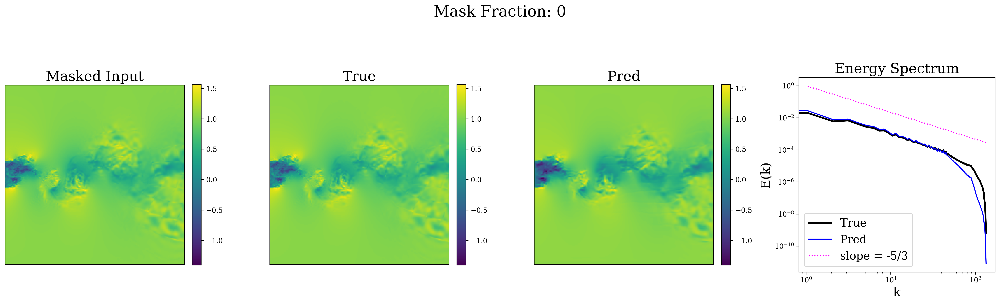

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



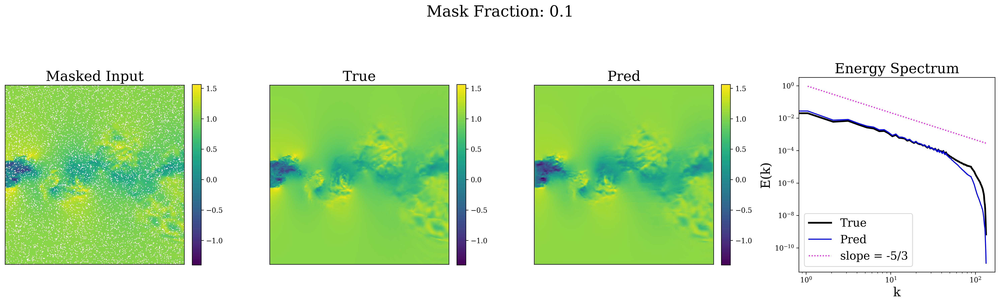

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



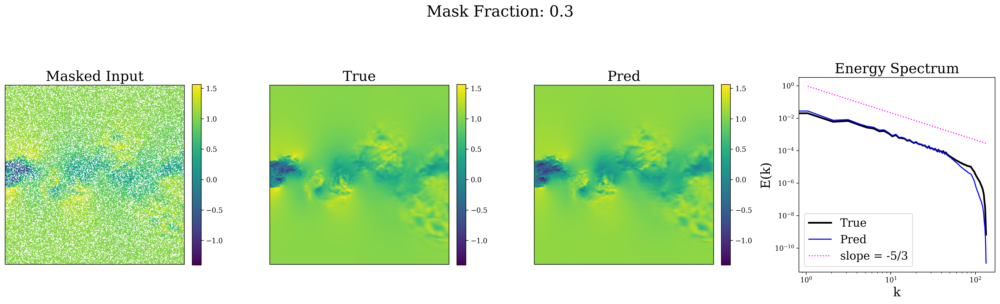

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



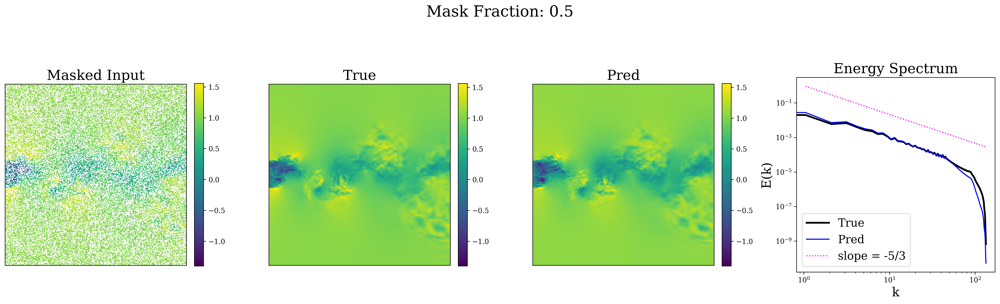

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



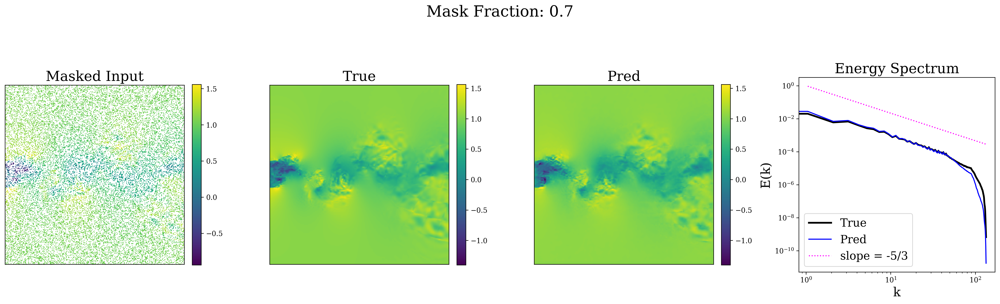

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



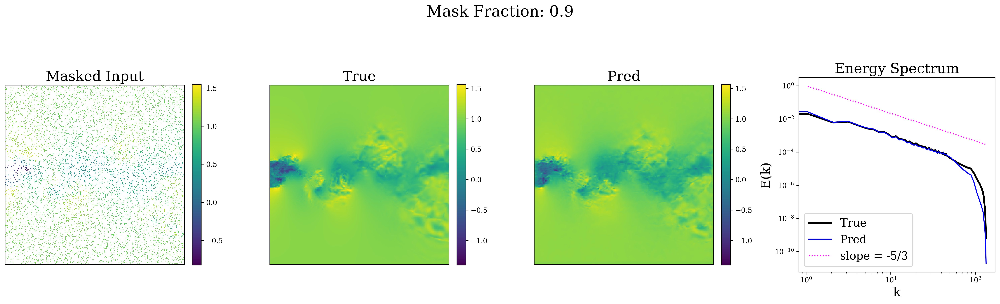

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



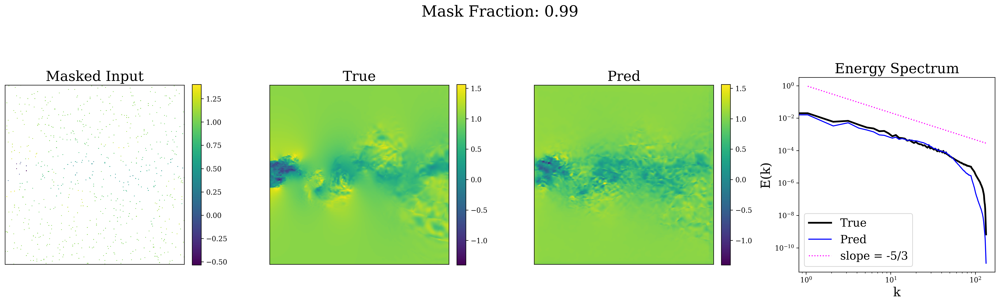

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



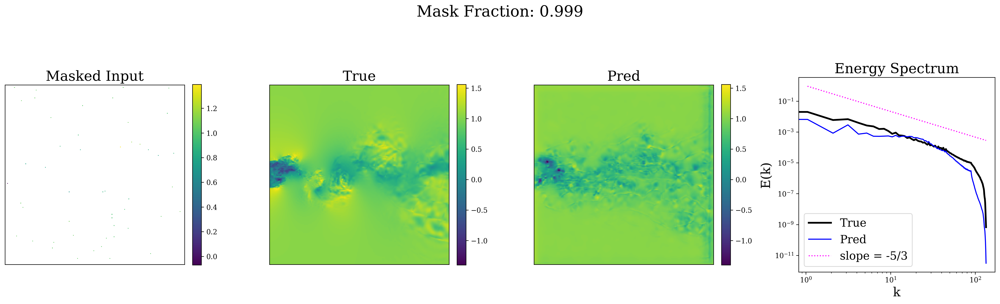

In [9]:
torch.manual_seed(23)


for mp in [0, 0.1, 0.3, 0.5, 0.7, 0.9, 0.99, 0.999]:
# for mp in [1.0]:
        
    MASK_PERCENT = mp
    
    l_fidel_ls = []
    y_pred_ls = []
    y_true_ls = []
    
    model.eval()
    test_loss = 0.0
    with torch.no_grad():
        for x_idx, t_idx, y_idx in test_loader:
            l_fidel = traj_i_test_tensor[0, x_idx].to(device)
            tt = time_cond_tensor[t_idx].to(device)
            h_fidel = traj_o_test_tensor[0, y_idx].to(device)

        # for x_idx, _, y_idx in val_loader:
        #     x_idx = x_idx[-6:]
        #     y_idx = y_idx[-6:]
        #     l_fidel = traj_i_val_tensor[0, x_idx].to(device)
        #     h_fidel = traj_o_val_tensor[0, y_idx].to(device)
    
            # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))
    
            l_fidel, h_true = random_point_inpainting_prep(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    
            # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))
            print(l_fidel.shape)
    
            # NOISE = noise.repeat(l_fidel.shape[0], 1,1,1,1)
            if True:
                # pred = model.deterministic_sample(l_fidel.to(device), NOISE, num_sample_steps=32)
                pred = model(l_fidel, tt)
                loss   = error_metric(pred, h_fidel.to(device), Par)
            test_loss += loss.item()
            l_fidel_ls.append(l_fidel)
            y_true_ls.append(h_fidel)
            y_pred_ls.append(pred)
            break
    
    x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  

    
    
    
    x    = x.unsqueeze(2)
    true = true.unsqueeze(2)
    pred = pred.unsqueeze(2)

    
    # print(x.shape)
    
    # x = x*Par['inp_scale'][:,0,:4] + Par['inp_shift'][:,0,:4]
    # x = (x - Par['out_shift'][:,0,:4])/Par['out_scale'][:,0,:4]
    
    print(f'x: {x.shape}')
    print(f'true: {true.shape}')
    print(f'pred: {pred.shape}')
    
    sample_id = 0 #random.randint(0, x.shape[0]-1)
    f_id = 0
    t_id = 0
    z_id = 16
    
    CMAP = "viridis"
    
    lx,ly,lz = 8,8,2
    
    knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
    knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )
    
    
    s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

    MASK_og = x[:, 4:5]
    MASK = x[sample_id, 4, t_id, :, :, z_id]
    MASK = MASK.detach().cpu().numpy()

    # X = x[:,:4]
    
    # X = X*Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
    # X = (X - Par['out_shift']).permute(0,2,1,3,4,5)/Par['out_scale'].permute(0,2,1,3,4,5)

    # x = x[:,:4] * Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
    # true = true * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)
    # pred = pred * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)

    print()
    print('Saving ...')
    os.makedirs('random_point_reconstruction', exist_ok=True)
    np.savez(f'random_point_reconstruction/data_{mp}.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

    print()
    
    
    X = x[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    T = true[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    P = pred[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    
    
    masked_X = np.ma.masked_where(MASK == 0, X)
    
    VMIN = np.min(T)
    VMAX = np.max(T)
    # VMIN = -1
    # VMAX = +

    
    fig, axes = plt.subplots(1,4, figsize=(20,5))
    im = axes[0].imshow(masked_X, cmap=CMAP, interpolation='none')
    axes[0].set_title("Masked Input", fontsize=20)
    fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[1].set_title("True", fontsize=20)
    fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[2].set_title("Pred", fontsize=20)
    fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
    axes[2].set_xticks([])
    axes[2].set_yticks([])

    
    axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
    axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
    axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
    axes[3].legend(fontsize=16)
    axes[3].set_title('Energy Spectrum', fontsize=20)
    axes[3].set_xlabel("k", fontsize = 18)
    axes[3].set_ylabel("E(k)", fontsize=18)
    
    
    
    plt.tight_layout()
    
    
    fig.suptitle(f"Mask Fraction: {MASK_PERCENT}", fontsize=22, y=1.2)
    plt.show()
    # plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
    plt.close()

# Test Setup 2 - Saving Predictions

In [7]:
def plane_to_full_field(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0, Z_IDX=[15]):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    temp_mask = torch.zeros((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    # Set the mid z-slice to 1
    for item in Z_IDX:
        temp_mask[:, 0, :, :, item] = 1.0

    mask1 = mask*temp_mask

    
    mask1 = mask1.repeat(1,4,1,1,1)
    # Apply the mask to x
    x_masked = x * mask1  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask1], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])


/tmp/ipykernel_1751220/4162220990.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]



Saving ...



/tmp/ipykernel_1751220/4021139579.py:145: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


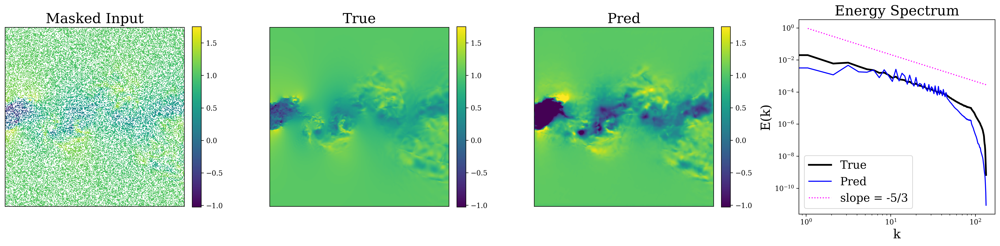

In [17]:
torch.manual_seed(23)


# for mp in [0, 0.1, 0.3, 0.5, 0.7, 0.9, 0.99, 0.999]:
# for mp in [1.0]:
        
    # MASK_PERCENT = mp

MASK_PERCENT = 0.5

Z_IDX=15
Z_IDX_LS = [Z_IDX]

l_fidel_ls = []
y_pred_ls = []
y_true_ls = []

model.eval()
test_loss = 0.0
with torch.no_grad():
    for x_idx, t_idx, y_idx in test_loader:
        l_fidel = traj_i_test_tensor[0, x_idx].to(device)
        tt = time_cond_tensor[t_idx].to(device)
        h_fidel = traj_o_test_tensor[0, y_idx].to(device)

        # l_fidel, h_true = plane_to_full_field(l_fidel, h_fidel, z_idx=Z_IDX)
        l_fidel, h_true = plane_to_full_field(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT, Z_IDX=Z_IDX_LS)

        # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))
        print(l_fidel.shape)

        # NOISE = noise.repeat(l_fidel.shape[0], 1,1,1,1)
        if True:
            # pred = model.deterministic_sample(l_fidel.to(device), NOISE, num_sample_steps=32)
            pred = model(l_fidel, tt)
            loss   = error_metric(pred, h_fidel.to(device), Par)
        test_loss += loss.item()
        l_fidel_ls.append(l_fidel)
        y_true_ls.append(h_fidel)
        y_pred_ls.append(pred)
        break

x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  


x    = x.unsqueeze(2)
true = true.unsqueeze(2)
pred = pred.unsqueeze(2)


print(f'x: {x.shape}')
print(f'true: {true.shape}')
print(f'pred: {pred.shape}')

sample_id = 0 #random.randint(0, x.shape[0]-1)
f_id = 0
t_id = 0
z_id = 15

CMAP = "viridis"

lx,ly,lz = 8,8,2

knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )


s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

MASK_og = x[:, -1:]
MASK = x[sample_id, -1, t_id, :, :, z_id]
MASK = MASK.detach().cpu().numpy()

print()
print('Saving ...')
os.makedirs('plane_to_full_field', exist_ok=True)
np.savez(f'plane_to_full_field/data.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

print()


X = x[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
T = true[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
P = pred[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()


masked_X = np.ma.masked_where(MASK == 0, X)

VMIN = np.min(T)
VMAX = np.max(T)
# VMIN = -1
# VMAX = +


fig, axes = plt.subplots(1,4, figsize=(20,5))
im = axes[0].imshow(masked_X, cmap=CMAP, interpolation='none')
axes[0].set_title("Masked Input", fontsize=20)
fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
axes[0].set_xticks([])
axes[0].set_yticks([])

im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[1].set_title("True", fontsize=20)
fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
axes[1].set_xticks([])
axes[1].set_yticks([])

im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[2].set_title("Pred", fontsize=20)
fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
axes[2].set_xticks([])
axes[2].set_yticks([])


axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
axes[3].legend(fontsize=16)
axes[3].set_title('Energy Spectrum', fontsize=20)
axes[3].set_xlabel("k", fontsize = 18)
axes[3].set_ylabel("E(k)", fontsize=18)



plt.tight_layout()


# fig.suptitle(f"Mask Fraction: {MASK_PERCENT}", fontsize=22, y=1.2)
plt.show()
# plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
plt.close()

# Test Setup 3 - Saving Predictions

In [20]:
def reg_invertpainting_prep(x: torch.Tensor, y: torch.Tensor, x0=96, y0=32, z0=12, lx=32, ly=32, lz=8, min_percent=0.0, max_percent=1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]  (same content as x[:,0])
    
    Returns:
      x_in: [bs, nf+1, nx, ny, nz]  (masked x with mask concatenated)
      y    : unchanged target tensor
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype

    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    # 1) Build mask: shape [bs,1,1,nx,ny,nz], same mask for all batch entries
    #    Start all ones, then zero out 1–4 random patches.
    temp_mask = torch.zeros((bs, 1, nx, ny, nz), device=device, dtype=dtype)
    num_patches = 1 #random.choice([1, 2, 3, 4])
    for _ in range(num_patches):
        temp_mask[..., x0:x0+lx, y0:y0+ly, z0:z0+lz] = 1


    mask = mask * temp_mask
    # repeat across batch
    mask = mask.repeat(1, 4, 1, 1, 1)  # [bs,1,nx,ny,nz]

    # mask = 1 - mask

    # 2) apply mask to x
    x_masked = x * mask

    # 3) concatenate mask as an extra feature channel along dim=2
    #    so channel count goes from nf → nf+1
    x_in = torch.cat([x_masked, mask], dim=1)  # → [bs,nf+1,nx,ny,nz]

    # return the prepared input and the original target
    return x_in, y

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])


/tmp/ipykernel_1751220/4162220990.py:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]



Saving ...



/tmp/ipykernel_1751220/3065064154.py:150: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


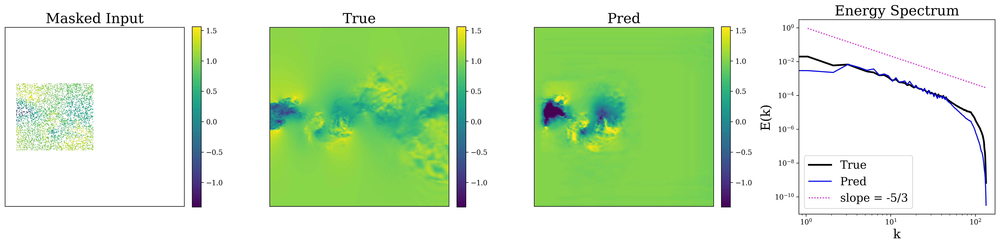

In [21]:
x0=80
y0=16 #16 #24
z0=12
lx=96
ly=110
lz=8


torch.manual_seed(15)

MASK_PERCENT = 0.7


# for mp in [0, 0.1, 0.3, 0.5, 0.7, 0.9, 0.99, 0.999]:
# for mp in [1.0]:
        
    # MASK_PERCENT = mp

l_fidel_ls = []
y_pred_ls = []
y_true_ls = []

model.eval()
test_loss = 0.0
with torch.no_grad():
    for x_idx, t_idx, y_idx in test_loader:
        l_fidel = traj_i_test_tensor[0, x_idx].to(device)
        tt = time_cond_tensor[t_idx].to(device)
        h_fidel = traj_o_test_tensor[0, y_idx].to(device)

    # for x_idx, _, y_idx in val_loader:
    #     x_idx = x_idx[-6:]
    #     y_idx = y_idx[-6:]
    #     l_fidel = traj_i_val_tensor[0, x_idx].to(device)
    #     h_fidel = traj_o_val_tensor[0, y_idx].to(device)

        # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))

        # l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel, x0,y0,z0,lx,ly,lz)
        l_fidel, h_true = reg_invertpainting_prep(l_fidel, h_fidel, x0,y0,z0,lx,ly,lz, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)

        # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))
        print(l_fidel.shape)

        # NOISE = noise.repeat(l_fidel.shape[0], 1,1,1,1)
        if True:
            # pred = model.deterministic_sample(l_fidel.to(device), NOISE, num_sample_steps=32)
            pred = model(l_fidel.to(device), tt)
            loss   = error_metric(pred, h_fidel.to(device), Par)
        test_loss += loss.item()
        l_fidel_ls.append(l_fidel)
        y_true_ls.append(h_fidel)
        y_pred_ls.append(pred)
        break

x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  


x    = x.unsqueeze(2)
true = true.unsqueeze(2)
pred = pred.unsqueeze(2)


# print(x.shape)

# x = x*Par['inp_scale'][:,0,:4] + Par['inp_shift'][:,0,:4]
# x = (x - Par['out_shift'][:,0,:4])/Par['out_scale'][:,0,:4]

print(f'x: {x.shape}')
print(f'true: {true.shape}')
print(f'pred: {pred.shape}')

sample_id = 0 #random.randint(0, x.shape[0]-1)
f_id = 0
t_id = 0
z_id = 16

CMAP = "viridis"

lx,ly,lz = 8,8,2

knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )


s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

MASK_og = x[:, -1:]
MASK = x[sample_id, -1, t_id, :, :, z_id]
MASK = MASK.detach().cpu().numpy()

# X = x[:,:4]

# X = X*Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
# X = (X - Par['out_shift']).permute(0,2,1,3,4,5)/Par['out_scale'].permute(0,2,1,3,4,5)

# x = x[:,:4] * Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
# true = true * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)
# pred = pred * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)

print()
print('Saving ...')
os.makedirs('patch_to_full_field', exist_ok=True)
np.savez(f'patch_to_full_field/data.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

print()


X = x[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
T = true[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
P = pred[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()


masked_X = np.ma.masked_where(MASK == 0, X)

VMIN = np.min(T)
VMAX = np.max(T)
# VMIN = -1
# VMAX = +


fig, axes = plt.subplots(1,4, figsize=(20,5))
im = axes[0].imshow(masked_X, cmap=CMAP, vmin=VMIN, vmax=VMAX, interpolation='none')
axes[0].set_title("Masked Input", fontsize=20)
fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
axes[0].set_xticks([])
axes[0].set_yticks([])

im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[1].set_title("True", fontsize=20)
fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
axes[1].set_xticks([])
axes[1].set_yticks([])

im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
axes[2].set_title("Pred", fontsize=20)
fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
axes[2].set_xticks([])
axes[2].set_yticks([])


# im = axes[3].imshow(np.abs(T-P), cmap=CMAP)
# axes[3].set_title("Absolute Error", fontsize=20)
# fig.colorbar(im, ax=axes[3], fraction=0.046, pad=0.04)
# axes[3].set_xticks([])
# axes[3].set_yticks([])

axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
axes[3].legend(fontsize=16)
axes[3].set_title('Energy Spectrum', fontsize=20)
axes[3].set_xlabel("k", fontsize = 18)
axes[3].set_ylabel("E(k)", fontsize=18)



plt.tight_layout()


# fig.suptitle(f"Mask Fraction: {MASK_PERCENT}", fontsize=22, y=1.2)
plt.show()
# plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
plt.close()

# Test Setup 4 - Saving Predictions

In [30]:

def random_vel_to_pressure(x: torch.Tensor, y: torch.Tensor,
                                  min_percent: float = 0.0, max_percent: float = 1.0):
    """
    x: torch.Tensor of shape [bs, nf, nx, ny, nz]
    y: torch.Tensor of shape [bs, nf, nx, ny, nz]

    Returns:
      x_in: [bs, nf+1, nx, ny, nz] - randomly masked x concatenated with mask
      y   : unchanged target
    """
    bs, nf, nx, ny, nz = x.shape
    device, dtype = x.device, x.dtype
    total_voxels = nx * ny * nz

    # Create empty mask container
    mask = torch.ones((bs, 1, nx, ny, nz), device=device, dtype=dtype)
    zero_mask = torch.zeros((bs, 1, nx, ny, nz), device=device, dtype=dtype)

    for b in range(bs):
        # Sample a random masking percentage for this sample
        masking_percent = random.uniform(min_percent, max_percent)
        num_masked_voxels = int(total_voxels * masking_percent)

        # Generate random indices to mask
        indices = torch.randperm(total_voxels, device=device)[:num_masked_voxels]

        # Convert flat indices to 3D coordinates
        x_idx = indices // (ny * nz)
        y_idx = (indices % (ny * nz)) // nz
        z_idx = indices % nz

        # Apply masking
        mask[b, 0, x_idx, y_idx, z_idx] = 0

    # masking_percent = random.uniform(min_percent, max_percent)
    # rand_field = torch.rand((bs, 1, nx, ny, nz), device=device)
    # mask = (rand_field > masking_percent).float()

    mask = mask.repeat(1,3,1,1,1)
    mask = torch.cat([mask, zero_mask], dim=1)
    
    # Apply the mask to x
    x_masked = x * mask  # broadcast along channel dim

    # Concatenate mask as extra channel
    x_in = torch.cat([x_masked, mask], dim=1)  # [bs, nf+1, nx, ny, nz]

    return x_in, y

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])


/tmp/ipykernel_3424756/4026015118.py:126: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u_all = torch.tensor(u_all, dtype=DTYPE, device=device) # [3, ntime, nx, ny, nz]



Saving ...



/tmp/ipykernel_3424756/1419741204.py:144: RuntimeWarning: divide by zero encountered in power
  axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")


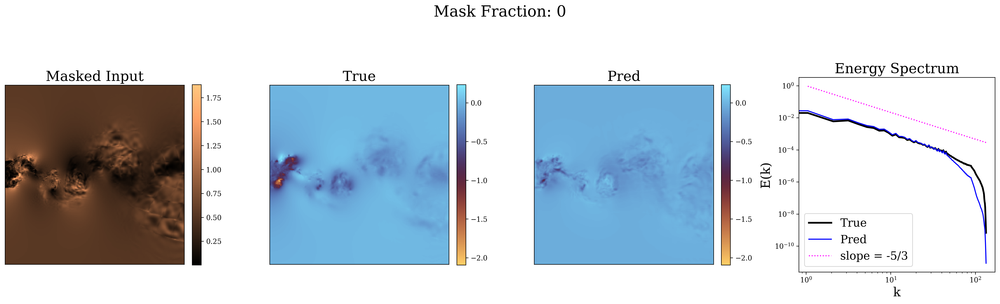

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



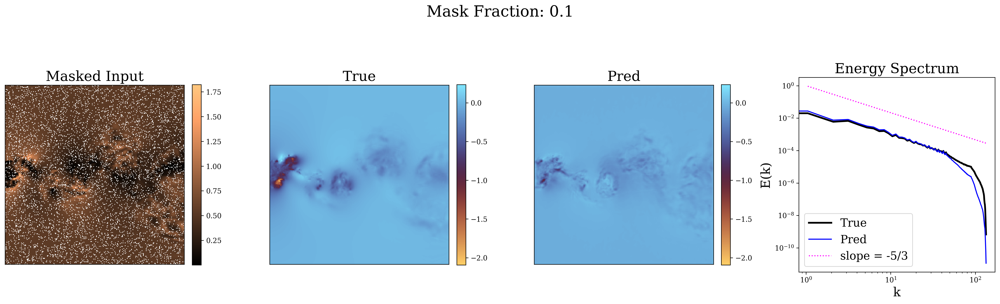

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



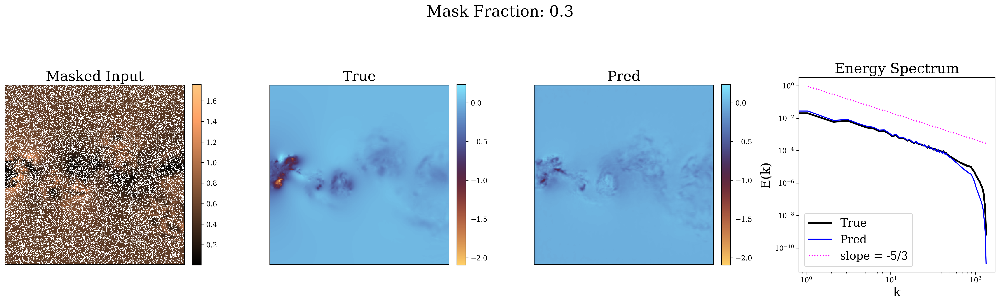

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



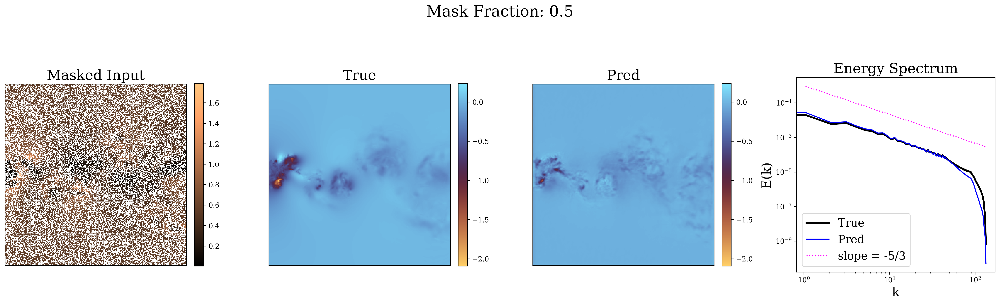

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



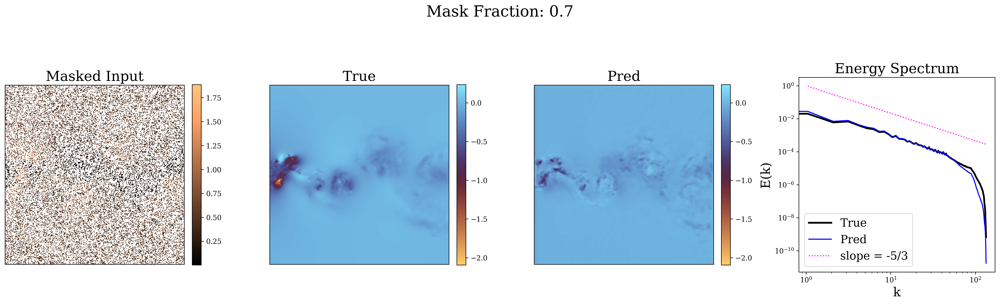

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



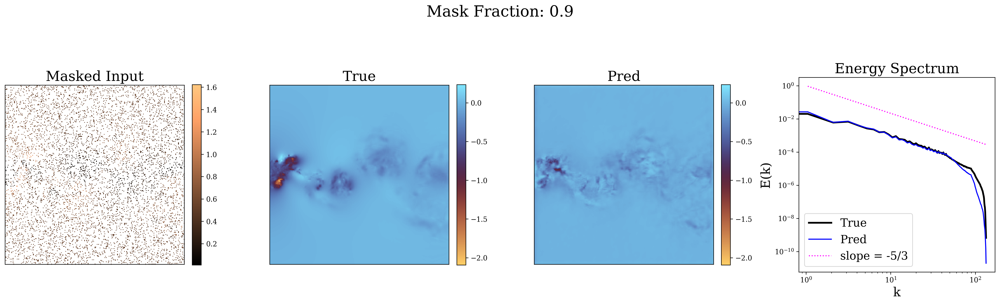

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



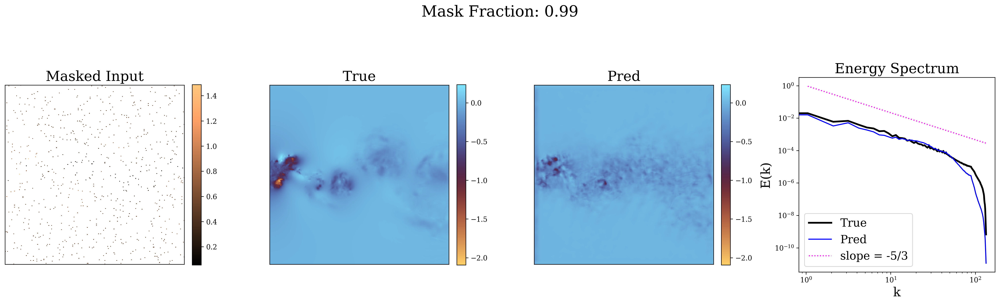

torch.Size([6, 8, 256, 256, 32])
x: torch.Size([6, 8, 1, 256, 256, 32])
true: torch.Size([6, 4, 1, 256, 256, 32])
pred: torch.Size([6, 4, 1, 256, 256, 32])

Saving ...



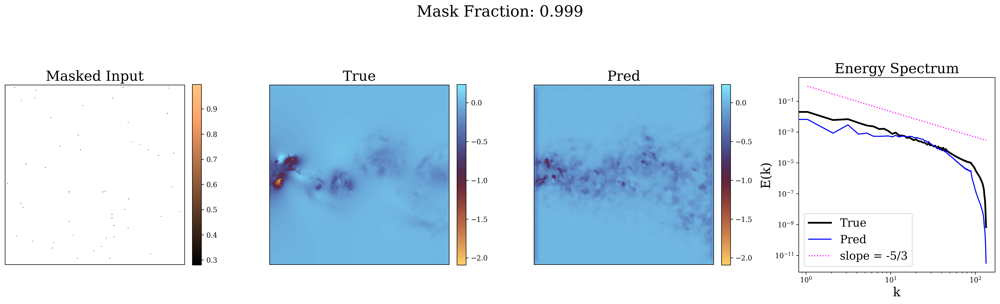

In [31]:
torch.manual_seed(23)


for mp in [0, 0.1, 0.3, 0.5, 0.7, 0.9, 0.99, 0.999]:
# for mp in [1.0]:
        
    MASK_PERCENT = mp
    
    l_fidel_ls = []
    y_pred_ls = []
    y_true_ls = []
    
    model.eval()
    test_loss = 0.0
    with torch.no_grad():
        for x_idx, t_idx, y_idx in test_loader:
            l_fidel = traj_i_test_tensor[0, x_idx].to(device)
            tt = time_cond_tensor[t_idx].to(device)
            h_fidel = traj_o_test_tensor[0, y_idx].to(device)

        # for x_idx, _, y_idx in val_loader:
        #     x_idx = x_idx[-6:]
        #     y_idx = y_idx[-6:]
        #     l_fidel = traj_i_val_tensor[0, x_idx].to(device)
        #     h_fidel = traj_o_val_tensor[0, y_idx].to(device)
    
            # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))
    
            l_fidel, h_true = random_vel_to_pressure(l_fidel, h_fidel, min_percent=MASK_PERCENT, max_percent=MASK_PERCENT)
    
            # print(torch.min(l_fidel[:,0]), torch.max(l_fidel[:,0]))
            print(l_fidel.shape)
    
            # NOISE = noise.repeat(l_fidel.shape[0], 1,1,1,1)
            if True:
                # pred = model.deterministic_sample(l_fidel.to(device), NOISE, num_sample_steps=32)
                pred = model(l_fidel.to(device), tt)
                loss   = error_metric(pred, h_fidel.to(device), Par)
            test_loss += loss.item()
            l_fidel_ls.append(l_fidel)
            y_true_ls.append(h_fidel)
            y_pred_ls.append(pred)
            break
    
    x, true, pred = l_fidel, h_fidel, y_pred_ls[0]  
    
    
    x    = x.unsqueeze(2)
    true = true.unsqueeze(2)
    pred = pred.unsqueeze(2)

    
    # print(x.shape)
    
    # x = x*Par['inp_scale'][:,0,:4] + Par['inp_shift'][:,0,:4]
    # x = (x - Par['out_shift'][:,0,:4])/Par['out_scale'][:,0,:4]
    
    print(f'x: {x.shape}')
    print(f'true: {true.shape}')
    print(f'pred: {pred.shape}')
    
    sample_id = 0 #random.randint(0, x.shape[0]-1)
    f_id = 3
    t_id = 0
    z_id = 16
    
    CMAP = "managua"
    
    lx,ly,lz = 8,8,2
    
    knyquist, wave_numbers, spectrum_true = compute_tke_spectrum_timeseries_torch( true[sample_id, :3], lx,ly,lz, device=device  )
    knyquist, wave_numbers, spectrum_pred = compute_tke_spectrum_timeseries_torch( pred[sample_id, :3], lx,ly,lz, device=device  )
    
    
    s_err = np.mean( (np.log(spectrum_true[:,:])-np.log(spectrum_pred[:,:]) )**2 )

    MASK_og = x[:, 4:]
    MASK = x[sample_id, -1, t_id, :, :, z_id]
    MASK = MASK.detach().cpu().numpy()

    MASK_vel = x[sample_id, -2, t_id, :, :, z_id].detach().cpu().numpy()

    # X = x[:,:4]
    
    # X = X*Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
    # X = (X - Par['out_shift']).permute(0,2,1,3,4,5)/Par['out_scale'].permute(0,2,1,3,4,5)

    # x = x[:,:4] * Par['inp_scale'].permute(0,2,1,3,4,5) + Par['inp_shift'].permute(0,2,1,3,4,5)
    # true = true * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)
    # pred = pred * Par['out_scale'].permute(0,2,1,3,4,5) + Par['out_shift'].permute(0,2,1,3,4,5)

    print()
    print('Saving ...')
    os.makedirs('vel_to_pressure', exist_ok=True)
    np.savez(f'vel_to_pressure/data_{mp}.npz', x=x.detach().cpu().numpy(), true=true.detach().cpu().numpy(), pred=pred.detach().cpu().numpy(), MASK_og=MASK_og.detach().cpu().numpy())

    print()
    
    
    X = x[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    T = true[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()
    P = pred[sample_id, f_id, t_id, :, :, z_id].detach().cpu().numpy()

    ke = get_ke(x[sample_id, :, t_id, :, :, z_id].detach().cpu().numpy())

    
    
    masked_X = np.ma.masked_where(MASK_vel == 0,  ke) 
    
    VMIN = np.min(T)
    VMAX = np.max(T)
    # VMIN = -1
    # VMAX = +

    
    fig, axes = plt.subplots(1,4, figsize=(20,5))
    im = axes[0].imshow(masked_X, cmap='copper', interpolation='none')
    axes[0].set_title("Masked Input", fontsize=20)
    fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    im = axes[1].imshow(T, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[1].set_title("True", fontsize=20)
    fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    im = axes[2].imshow(P, cmap=CMAP, vmin=VMIN, vmax=VMAX)
    axes[2].set_title("Pred", fontsize=20)
    fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)
    axes[2].set_xticks([])
    axes[2].set_yticks([])


    # im = axes[3].imshow(np.abs(T-P), cmap=CMAP)
    # axes[3].set_title("Absolute Error", fontsize=20)
    # fig.colorbar(im, ax=axes[3], fraction=0.046, pad=0.04)
    # axes[3].set_xticks([])
    # axes[3].set_yticks([])
    
    axes[3].loglog(wave_numbers, spectrum_true[t_id], label="True", color="black", lw=2.5)
    axes[3].loglog(wave_numbers, spectrum_pred[t_id], label="Pred", color="blue", lw=1.5)
    axes[3].loglog(wave_numbers, wave_numbers**(-5/3), label="slope = -5/3", color="magenta", ls="dotted")
    axes[3].legend(fontsize=16)
    axes[3].set_title('Energy Spectrum', fontsize=20)
    axes[3].set_xlabel("k", fontsize = 18)
    axes[3].set_ylabel("E(k)", fontsize=18)
    
    
    
    plt.tight_layout()
    
    
    fig.suptitle(f"Mask Fraction: {MASK_PERCENT}", fontsize=22, y=1.2)
    plt.show()
    # plt.savefig(f"images/{epoch}.png", dpi=150, bbox_inches='tight')
    plt.close()